# Projet PRSTIM/TIFO

L'objectif de ce projet consiste à compter les bateaux sur chacune des deux images.

# Sommaire

- On compte les bateaux
- Lecture de la date incrustée
- Segmentation de l'eau

In [1]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

In [2]:
!unzip data/data.zip

Archive:  data/data.zip
replace Tulips_0504.png? [y]es, [n]o, [A]ll, [N]one, [r]ename: ^C


In [2]:
!ls data

data.zip	 Tulips_1004.png  Tulips_2004.png  Venice_2019_scrib.png
Tulips_0504.png  Tulips_1504.png  Venice_2019.png  Venice_2020.png


## Chargement des images

In [3]:
# Load images
im1, im2 = (
    cv2.imread("data/Venice_2019.png"),
    cv2.imread("data/Venice_2020.png"),
)

print(im1[150][300])  # Clear
print(im1[  5][300])  # Less Clear
print(im2[300][  0])  # Dark

[114  98  39]
[126 134  81]
[100  94  23]


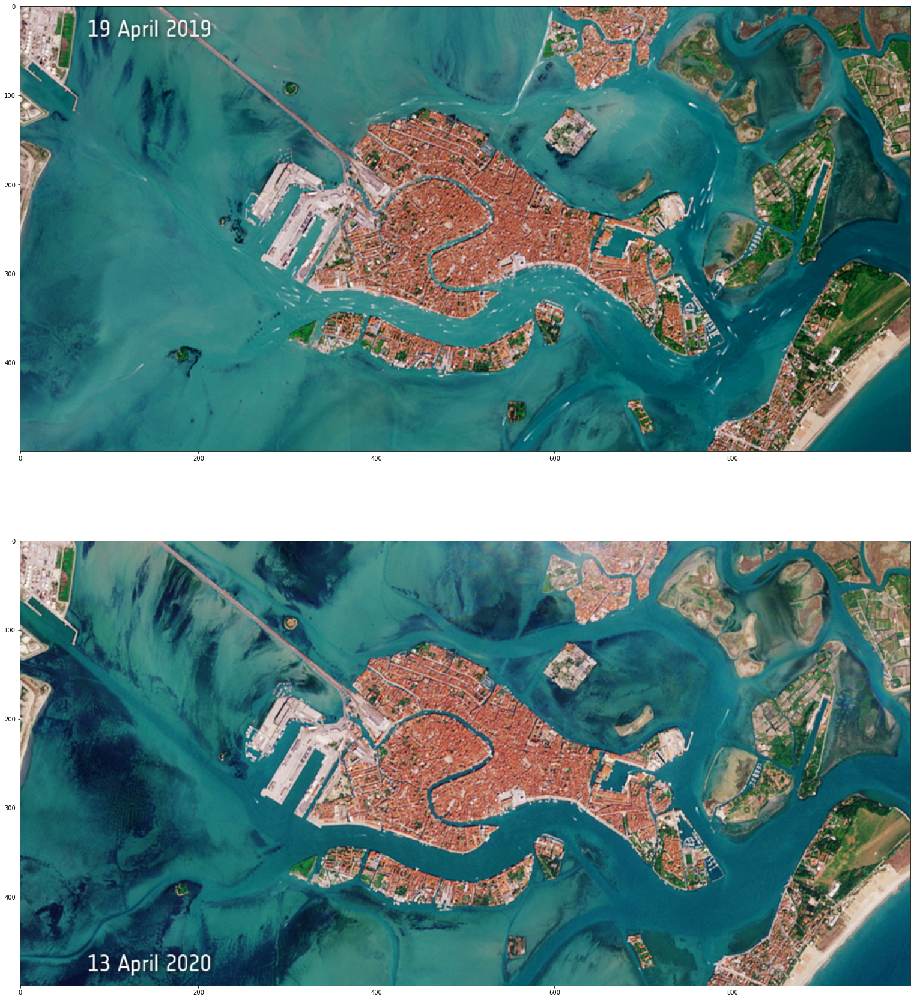

In [4]:
# Display
def bgr_to_rgb(img):
    b,g,r = cv2.split(img)
    return cv2.merge([r,g,b])

rgb1, rgb2 = bgr_to_rgb(im1), bgr_to_rgb(im2)
plt.figure(figsize=(60, 30))
plt.subplot(2, 1, 1)
plt.imshow(rgb1)
plt.subplot(2, 1, 2)
plt.imshow(rgb2)

## Segmentation de la date

In [13]:
def getFirstLastWhitePixel(img):
    topleft = (len(img),len(img))
    botright = (0,0)
    foundFirst = False
    for i, y in enumerate(img):
        for j, x in enumerate(y):
            if x == 255:
                topleft = (min(i, topleft[0]), min(j, topleft[1]))
                botright = (max(i, botright[0]), max(j, botright[1]))
    return (topleft, botright)

In [16]:
def dateSeg(img):
    copy = img.copy()
    copy[copy < 255] = 0
    copy = cv2.cvtColor(copy, cv2.COLOR_BGR2GRAY)
    top_left, bot_right = getFirstLastWhitePixel(copy)
    print(top_left)
    print(bot_right)
    crop = img[top_left[0]:bot_right[0], top_left[1]:bot_right[1]]
    plt.imshow(crop)
    

(17, 78)
(38, 212)


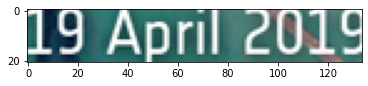

In [17]:
dateSeg(rgb1)

## Segmentation de l'eau

In [9]:
def get_water(img):
    water = np.zeros((img.shape[0], img.shape[1]))
    for x in range(img.shape[0]):
        for y in range(img.shape[1]):
            if img[x][y][0] > 90 and img[x][y][1] > 90 and img[x][y][2] < 50:  # BGR
                water[x][y] = 1
    return water


water1 = get_water(im1)
water2 = get_water(im2)

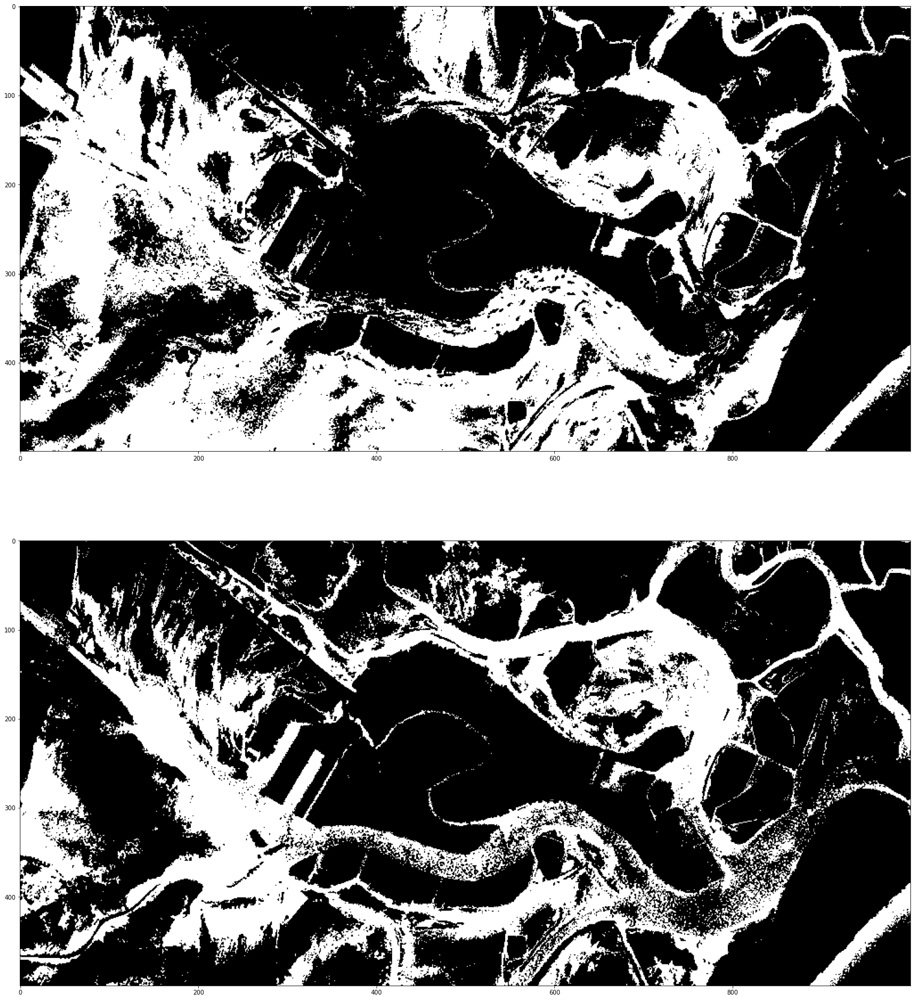

In [10]:
plt.figure(figsize=(60, 30))
plt.subplot(2, 1, 1)
plt.imshow(water1, cmap="gray")
plt.subplot(2, 1, 2)
plt.imshow(water2, cmap="gray")

## On compte les bateaux

Les bateaux font partie des éléments qui ne restent pas d'une image à l'autre. Comprendre : à une position donnée, la probabilité d'avoir un bateau sur les deux images est très faible. On peut donc travailler sur les différences entre les deux images. Voici notre plan d'attaque :

- Calcul de `abs(im2 - im1)` en niveaux de gris
    - Les zones claires constituent de grands écarts entre `im1` et `im2`
    - Les zones foncées constituent l'absence de différence entre `im1` et `im2`
- Binarisation, par seuillage, du résultat
    - On obtient un ensemble d'objets "différences" sur un fond noir
- Discrimination des objets : bateau ou pas bateau ?
    - Forme, taille, position relative à l'eau
- Bateau dans `im1` ou `im2` ?
    - Comparaison `im1`/`im2` à la position étudiée

### Pré-traitement

In [11]:
def preprocess(img):
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    # img = cv2.equalizeHist(img)
    return img.astype(np.int16)  # Because uint8 won't allow negatives when we im2-im1


processed_im1, processed_im2 = preprocess(im1), preprocess(im2)

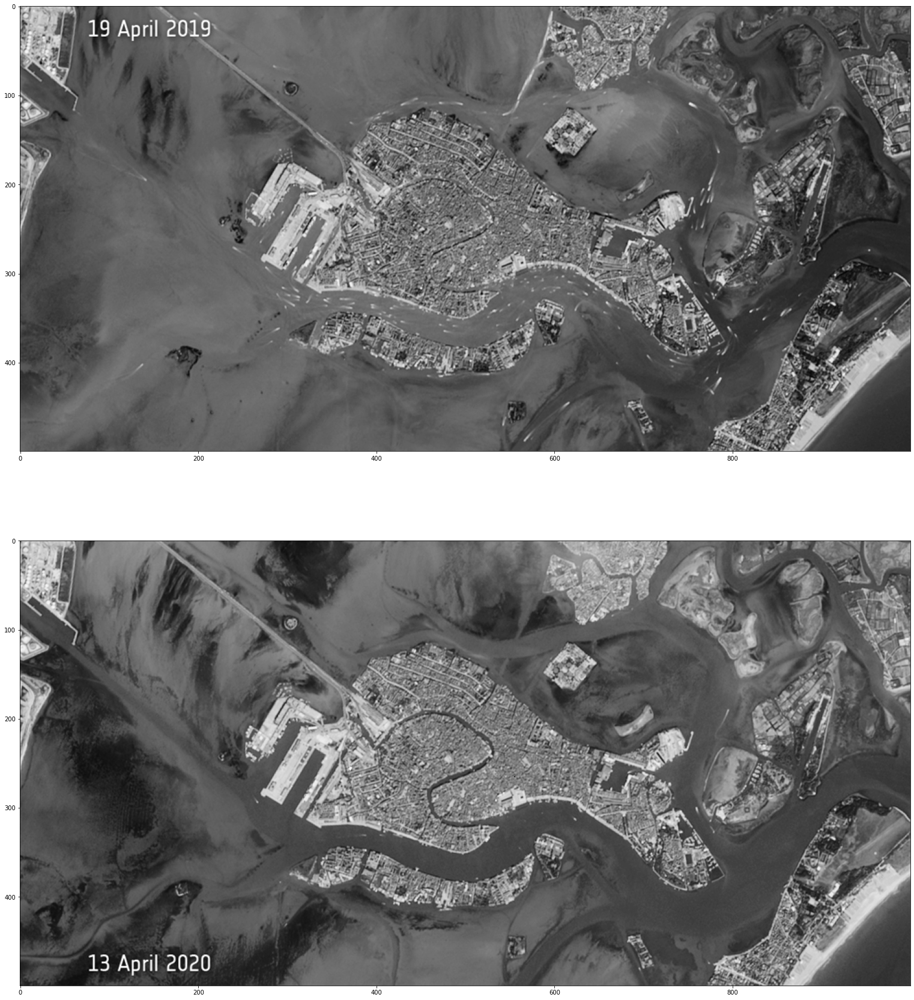

In [12]:
# Display
plt.figure(figsize=(60, 30))
plt.subplot(2, 1, 1)
plt.imshow(processed_im1, cmap="gray")
plt.subplot(2, 1, 2)
plt.imshow(processed_im2, cmap="gray")

### Différence entre `im1` et `im2`

Essayons différentes méthodes.

In [13]:
# Différence entre les deux niveaux de gris
diff = np.absolute(processed_im2 - processed_im1)

# Distance euclidienne (dans R^3) pixel à pixel
dist_rgb = np.apply_along_axis(
    np.linalg.norm,
    axis=2,
    arr=im2-im1
)

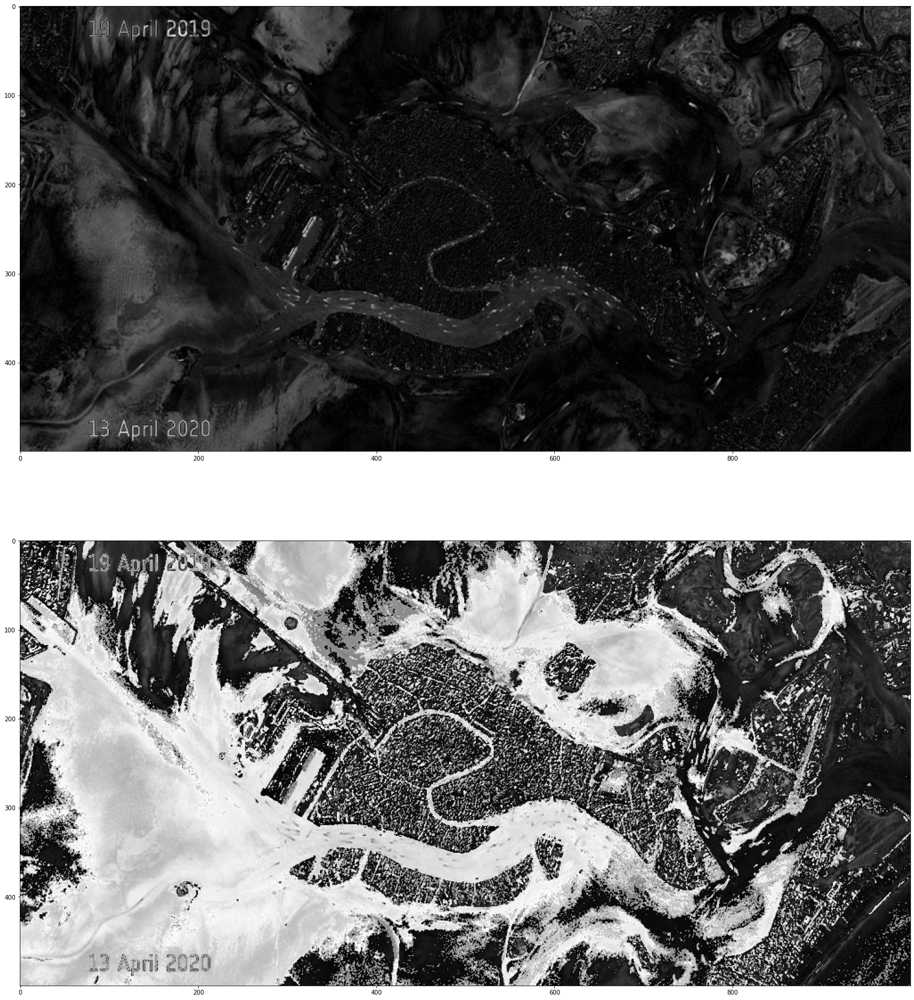

In [14]:
# Display
plt.figure(figsize=(60, 30))
plt.subplot(2, 1, 1)
plt.imshow(diff, cmap="gray")
plt.subplot(2, 1, 2)
plt.imshow(dist_rgb, cmap="gray")

Je préfère la première version.

**Problème** : dans les deux cas, certains bateaux apparaissent en foncé, et d'autres en clair.

En effet, sur certaines zones, la changement eau claire -> eau foncée est plus fort que le changement eau claire -> bateau (blanc).

**Idée** : c'est là que la segmentation de l'eau peut nous être utile : en sachant où se situe l'eau sur les deux images, nous pouvons considérer qu'un passage d'eau à eau ne constitue pas de changement, et donc mettre les pixels pertinents à 0.

### Seuillage

On essaie, pour le moment, avec des seuils choisis à la main, mais l'objectif sera d'utiliser les tests d'hypothèses pour choisir un seuil optimal.

In [15]:
# Bateaux clairs
# thresh1 = diff > 50

# Bateaux foncés
# thresh2 = diff < 15

In [16]:
# Display
# plt.figure(figsize=(60, 30))
# plt.subplot(2, 1, 1)
# plt.imshow(thresh1, cmap="gray")
# plt.subplot(2, 1, 2)
# plt.imshow(thresh2, cmap="gray")